In [151]:
!pip install polyglot
!pip install pyicu
!pip install pycld2
!pip install morfessor
!pip install wordcloud

import re
import numpy as np
import pandas as pd
import folium
import nltk
import spacy
from os import path
from PIL import Image
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.corpus import stopwords as sw
from gensim.corpora.dictionary import Dictionary
from gensim.models.tfidfmodel import TfidfModel
from collections import Counter
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tqdm
from collections import defaultdict
import polyglot
from polyglot.text import Text
from wordcloud import WordCloud, STOPWORDS
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
from sklearn.multiclass import OneVsRestClassifier
from sklearn.pipeline import Pipeline

nltk.download('punkt')
nltk.download('words')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('maxent_ne_chunker')

!polyglot download embeddings2.en
!polyglot download ner2.en

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[polyglot_data] Downloading package embeddings2.en to
[polyglot_data]     /root/polyglot_data...
[polyglot_data]   Package embeddings2.en is already up-to-date!
[polyglot_data] Downloading package ner2.en 

###DESCRIPTIONs.txt
One per category

In [0]:
def category_desc_to_txt(df, category_list):
  
  #Collect all the descriptions in a text file, one per category(11)
  
  text = ['']*len(category_list)
  df_filtered_list = []
  counter = 0

  for category in category_list:
    df_filtered_list.append(df_train[df_train['CATEGORY'].str.contains(category)==True])

  for index in range(len(df_filtered_list)):
    for description in df_filtered_list[index].DESCRIPTION:
      text[index] = text[index] + ' ' + str(description)
      counter+=1
      if counter == int(report_1.shape[0]*split_rate):
        break

  category_list_names = []
  bad_chars = ['/', ' '] 

  for category in category_list:
    for i in bad_chars:
      category = category.replace(i, '')
    category_list_names.append(category.replace(i, ''))   

  for category, description in zip(category_list_names, text):
    f = open(category+'.txt',"w+")
    f.write(description)
    
  return category_list_names

In [0]:
#Read dataset and remove NA values
report_1 = pd.read_csv('Safety_GPS1.csv')
report_1 = report_1[pd.notna(report_1['DESCRIPTION'])]

#Category list extracted from harassment_risk_base.ipynb 
category_list = ['Touching /Groping','Catcalls/Whistles', 'Sexual Invites', 'Stalking', 'Others', 'Commenting',
                 'Rape / Sexual Assault', 'North East India Report', 'Indecent exposure', 'Chain Snatching', 
                 'Ogling/Facial Expressions/Staring', 'Taking pictures', 'Poor / No Street Lighting', 'Online Harassment']

#Split in train and test and create collections
split_rate = 0.8
df_train = report_1.iloc[0:int(report_1.shape[0]*split_rate), :].copy()
df_test = report_1.iloc[int(report_1.shape[0]*split_rate)+1:,: ].copy()
fileNames = category_desc_to_txt(df_train, category_list) 

### Tokenization + Lemmatization + Stemming
Top 20 most used words different outputs

In [0]:
def top20_and_allTokens(filename, stemming=True, lemmatization=True, plot=True):
  
  lemmatizer = WordNetLemmatizer()
  stemmer = PorterStemmer()
  category = open(filename, 'r')
  content = category.read().lower()
  pattern_wd_eng = (r'[A-Za-z]+') 
  
  print('\n', filename)
  
  #Tokenization
  tokens = re.findall(pattern_wd_eng, content)
  no_stops = [t for t in tqdm(tokens) if t not in stopwords.words('english')]
  
  print('Words and digits eng :\n', re.findall(pattern_wd_eng, content))
  print('\nSet() unique words and digits eng :\n', set(re.findall(pattern_wd_eng, content)))
  print('\nAfter nostop filter :\n', no_stops)
  
  top_20_a = Counter(no_stops).most_common(20)
  print('\nTop 20 most used words after non_stop:\n', top_20_a)
  
  #Lemmatization
  lemmatized = [lemmatizer.lemmatize(word, pos="v") for word in no_stops]
  print('\nAfter lemmatizer :\n', lemmatized) if lemmatization else None
  top_20_b = Counter(lemmatized).most_common(20)
  print('\nTop 20 most used words after lemmatizer:\n', top_20_b) if lemmatization else None
  
  #Stemming
  stemmed = [stemmer.stem(word) for word in lemmatized]
  print('\nAfter stemmer :\n', stemmed) if stemming else None
  top_20 = Counter(stemmed).most_common(20)
  print('\nTop 20 most used words after stemmer:\n', top_20) if stemming else None
  
  top20_token = [word[0] for word in top_20]
  top20_count = [word[1] for word in top_20]
  
  if plot:
    fig, ax = plt.subplots()
    fig.set_size_inches(20, 5)
    plt.bar(labels, values, color='g')
    plt.show()
    
  total_tokens = lemmatized if lemmatization else no_stops
  total_tokens = stemmed if stemming else total_tokens
  
  return total_tokens

### Tf_idf

In [0]:
def top20_tf_idf(category_tokens):
  
  # Build a dicitionary with all the unique tokens merging all categories
  dictionary = Dictionary(category_tokens)

  # Corpus: List(7 items) of list(for each collection) of tuples of word_id and count
  corpus = [dictionary.doc2bow(collection) for collection in category_tokens]

  print('\ncorpus: {}'.format(len(corpus)))
  
  # Create a new TfidfModel using the corpus: tfidf
  tfidf = TfidfModel(corpus)

  print('Top_20 after Term Frequency–Inverse Document Frequency')  
  
  for index, tokens_and_Cnt in enumerate(corpus):
    print('\n', fileNames[index])
    
  # Calculate the tfidf weights of doc: tfidf_weights
    tfidf_weights = tfidf[tokens_and_Cnt]

  # Sort the weights from highest to lowest: sorted_tfidf_weights
    sorted_tfidf_weights = sorted(tfidf_weights, key=lambda w: w[1], reverse=True)

  # Print the top 5 weighted words
    for term_id, weight in sorted_tfidf_weights[0:20]:
      print(dictionary.get(term_id), weight)
      
  return corpus, dictionary, tfidf

In [111]:
#With BOTH lemmatization and Stemming
top20_and_allTokens_list = [top20_and_allTokens(fileNames[i]+'.txt', plot=False) for i in range(len(fileNames))]
categories_allTokens = [top20_and_allTokens_list[i] for i in range(len(top20_and_allTokens_list))]
corpus, dictionary, tfidf = top20_tf_idf(categories_allTokens)


 TouchingGroping.txt


Words and digits eng :
 ['my', 'school', 'auto', 'driver', 'always', 'use', 'to', 'stare', 'at', 'me', 'or', 'try', 'to', 'talk', 'to', 'me', 'whenever', 'i', 'alone', 'in', 'auto', 'he', 'also', 'tries', 'to', 'touch', 'me', 'i', 'complained', 'it', 'to', 'my', 'mother', 'but', 'she', 'didn', 't', 'listen', 'to', 'my', 'problems', 'i', 'have', 'a', 'boyfriend', 'who', 'likes', 'touching', 'me', 'every', 'time', 'have', 'been', 'sent', 'to', 'the', 'shop', 'and', 'tells', 'me', 'to', 'go', 'to', 'his', 'place', 'i', 'don', 't', 'like', 'what', 'he', 'is', 'doing', 'have', 'tried', 'to', 'stop', 'him', 'but', 'he', 'refuses', 'there', 'are', 'boys', 'who', 'like', 'disturbing', 'me', 'and', 'touching', 'my', 'private', 'parts', 'if', 'you', 'were', 'walking', 'at', 'home', 'and', 'a', 'boy', 'comes', 'and', 'catches', 'your', 'buttocks', 'and', 'breast', 'is', 'there', 'any', 'problem', 'my', 'sister', 'and', 'i', 'was', 'going', 'to', 'eat', 'golgappa', 'and', 'a', 'boy', 'was', 'comme

Words and digits eng :
 ['i', 'was', 'in', 'market', 'with', 'my', 'mom', 'there', 'i', 'saw', 'a', 'man', 'was', 'sitting', 'beside', 'a', 'shop', 'and', 'he', 'was', 'continuously', 'staring', 'a', 'girl', 'after', 'sometime', 'he', 'started', 'whistling', 'at', 'her', 'was', 'walking', 'by', 'the', 'town', 'library', 'there', 'is', 'a', 'boy', 'who', 'likes', 'disturbing', 'me', 'when', 'am', 'on', 'the', 'road', 'and', 'he', 'throws', 'stones', 'at', 'me', 'when', 'i', 'refuse', 'a', 'boy', 'in', 'class', 'seven', 'is', 'calling', 'a', 'girl', 'his', 'sweet', 'baby', 'a', 'girl', 'senior', 'from', 'me', 'who', 'lived', 'in', 'my', 'apartment', 'was', 'harassed', 'by', 'group', 'of', 'boys', 'everdag', 'they', 'form', 'a', 'group', 'with', 'their', 'bike', 'and', 'harass', 'her', 'by', 'whistling', 'touching', 'and', 'commenting', 'a', 'girl', 'says', 'there', 'is', 'a', 'man', 'who', 'loves', 'disturbing', 'her', 'when', 'she', 'has', 'been', 'sent', 'to', 'the', 'shop', 'by', 'her

Words and digits eng :
 ['there', 'is', 'a', 'girl', 'whom', 'boys', 'have', 'been', 'writing', 'a', 'letter', 'to', 'her', 'and', 'putting', 'in', 'her', 'bag', 'there', 'is', 'a', 'girl', 'who', 'is', 'being', 'disturbed', 'y', 'a', 'boy', 'in', 'the', 'school', 'there', 'are', 'some', 'boys', 'who', 'likes', 'disturbing', 'a', 'girl', 'when', 'she', 'in', 'class', 'even', 'if', 'she', 'has', 'been', 'sent', 'they', 'follow', 'him', 'there', 'is', 'a', 'teacher', 'who', 'likes', 'touching', 'a', 'girl', 'on', 'the', 'breast', 'a', 'girl', 'is', 'asking', 'if', 'a', 'boy', 'comes', 'to', 'your', 'house', 'so', 'that', 'they', 'can', 'do', 'assignment', 'together', 'there', 'is', 'a', 'girl', 'who', 'is', 'being', 'forced', 'by', 'a', 'boy', 'to', 'love', 'him', 'but', 'she', 'is', 'against', 'it', 'he', 'even', 'threatens', 'to', 'kill', 'her', 'if', 'she', 'don', 't', 'do', 'so', 'in', 'our', 'school', 'there', 'is', 'a', 'male', 'teacher', 'who', 'follows', 'pupils', 'and', 'starts'

Words and digits eng :
 ['guy', 'just', 'started', 'following', 'me', 'there', 'is', 'a', 'boy', 'who', 'likes', 'disturbing', 'me', 'when', 'am', 'on', 'the', 'road', 'and', 'he', 'throws', 'stones', 'at', 'me', 'when', 'i', 'refuse', 'there', 'is', 'a', 'boy', 'who', 'likes', 'to', 'follow', 'me', 'and', 'i', 'don', 't', 'know', 'what', 'to', 'do', 'my', 'sister', 'and', 'i', 'was', 'going', 'to', 'eat', 'golgappa', 'and', 'a', 'boy', 'was', 'commenting', 'and', 'intentionally', 'bumping', 'into', 'my', 'cousin', 'a', 'boy', 'was', 'following', 'me', 'while', 'i', 'was', 'coming', 'back', 'from', 'school', 'there', 'is', 'a', 'boy', 'who', 'comes', 'at', 'our', 'shop', 'and', 'says', 'he', 'wants', 'us', 'to', 'be', 'friends', 'but', 'i', 'refused', 'if', 'he', 'follows', 'me', 'what', 'should', 'i', 'do', 'a', 'girl', 'reported', 'that', 'the', 'man', 'has', 'been', 'telling', 'her', 'to', 'go', 'into', 'his', 'house', 'with', 'this', 'man', 'many', 'times', 'and', 'refused', 'he', 

Words and digits eng :
 ['there', 'is', 'a', 'girl', 'who', 'loves', 'having', 'sex', 'and', 'getting', 'paid', 'then', 'she', 'buys', 'sweets', 'for', 'us', 'but', 'she', 'wants', 'to', 'stop', 'the', 'habit', 'what', 'should', 'she', 'do', 'if', 'a', 'boy', 'insists', 'in', 'having', 'sex', 'with', 'you', 'what', 'should', 'you', 'do', 'if', 'a', 'boy', 'comes', 'and', 'asks', 'you', 'if', 'you', 'can', 'be', 'his', 'girlfriend', 'why', 'do', 'you', 'always', 'keep', 'him', 'in', 'your', 'mind', 'and', 'even', 'if', 'you', 'don', 't', 'see', 'him', 'after', 'a', 'long', 'time', 'i', 'still', 'think', 'of', 'him', 'what', 'should', 'i', 'do', 'what', 'can', 'a', 'girl', 'do', 'when', 'she', 'feels', 'like', 'having', 'sex', 'and', 'she', 'does', 'not', 'want', 'to', 'break', 'her', 'virginity', 'what', 'if', 'your', 'boyfriend', 'wants', 'a', 'kiss', 'i', 'have', 'a', 'boyfriend', 'and', 'is', 'disturbing', 'really', 'disturbing', 'what', 'can', 'i', 'do', 'if', 'a', 'boy', 'tells', '

Words and digits eng :
 ['i', 'always', 'feel', 'shy', 'when', 'i', 'pass', 'past', 'boys', 'there', 'is', 'a', 'boy', 'who', 'tried', 'to', 'kiss', 'me', 'and', 'i', 'accepted', 'there', 'is', 'a', 'boy', 'who', 'is', 'disturbing', 'me', 'is', 'it', 'healthy', 'to', 'have', 'sex', 'while', 'still', 'in', 'your', 'menstrual', 'cycle', 'if', 'a', 'boy', 'hugs', 'you', 'inappropriately', 'what', 'should', 'you', 'do', 'there', 'is', 'a', 'boy', 'who', 'likes', 'disturbing', 'me', 'and', 'i', 'dont', 'know', 'what', 'to', 'do', 'if', 'your', 'periods', 'take', 'long', 'time', 'to', 'appear', 'what', 'might', 'be', 'wrong', 'if', 'a', 'boy', 'is', 'disturbing', 'you', 'and', 'you', 'have', 'refused', 'and', 'he', 'still', 'follows', 'you', 'what', 'do', 'you', 'do', 'and', 'if', 'a', 'boy', 'tells', 'you', 'to', 'have', 'sex', 'with', 'him', 'and', 'he', 'pays', 'you', 'what', 'should', 'you', 'do', 'what', 'can', 'you', 'do', 'when', 'a', 'boy', 'tells', 'you', 'he', 'wants', 'you', 'i', 

Words and digits eng :
 ['there', 'was', 'a', 'girl', 'who', 'went', 'to', 'study', 'at', 'her', 'friends', 'house', 'the', 'friend', 'went', 'out', 'to', 'buy', 'food', 'then', 'a', 'man', 'who', 'pretended', 'to', 'be', 'the', 'headteachers', 'brother', 'and', 'then', 'she', 'raped', 'her', 'the', 'girl', 'told', 'the', 'neighbors', 'who', 'helped', 'the', 'girl', 'by', 'taking', 'her', 'to', 'hospital', 'i', 'have', 'a', 'friend', 'who', 'was', 'raped', 'and', 'she', 'now', 'has', 'a', 'child', 'she', 'needs', 'advice', 'if', 'your', 'neighbor', 'who', 'is', 'a', 'man', 'calls', 'you', 'and', 'asks', 'you', 'to', 'go', 'and', 'buy', 'for', 'him', 'something', 'and', 'when', 'you', 'come', 'back', 'he', 'forces', 'you', 'to', 'sleep', 'with', 'him', 'what', 'should', 'you', 'do', 'there', 'was', 'one', 'of', 'my', 'friend', 'who', 'meta', 'man', 'that', 'forced', 'her', 'to', 'have', 'sex', 'with', 'him', 'he', 'told', 'my', 'friend', 'that', 'if', 'she', 'refuses', 'he', 'will', 'ki

Words and digits eng :
 ['a', 'girl', 'was', 'sent', 'to', 'shop', 'and', 'met', 'a', 'man', 'on', 'her', 'way', 'who', 'wanted', 'to', 'rape', 'her', 'and', 'screamed', 'for', 'help', 'as', 'she', 'was', 'running', 'when', 'a', 'girl', 'is', 'passing', 'some', 'boys', 'like', 'calling', 'her', 'and', 'they', 'are', 'telling', 'her', 'that', 'they', 'will', 'rape', 'her', 'reported', 'sexual', 'assault', 'and', 'north', 'east', 'report', 'my', 'friend', 'was', 'tried', 'to', 'be', 'kidnapped', 'as', 'she', 'was', 'dragged', 'into', 'a', 'car', 'commenting', 'at', 'some', 'one', 'happens', 'everyday', 'in', 'our', 'college', 'a', 'girl', 'was', 'harassed', 'and', 'not', 'supported', 'by', 'family', 'at', 'the', 'school', 'campus', 'touching', 'inapproriately', 'poor', 'street', 'lighting', 'north', 'east', 'report', 'faced', 'many', 'harassment', 'very', 'frequently', 'we', 'conducted', 'a', 'survey', 'as', 'part', 'of', 'our', 'sociology', 'assignment', 'course', 'offered', 'in', 'iit'

Words and digits eng :
 ['prefects', 'two', 'are', 'in', 'love', 'in', 'the', 'same', 'class', 'and', 'they', 'make', 'a', 'lot', 'of', 'noise', 'when', 'in', 'class', 'they', 'even', 'go', 'to', 'the', 'toilet', 'together', 'a', 'girl', 'says', 'she', 'has', 'four', 'girls', 'and', 'they', 'are', 'her', 'friends', 'and', 'classmates', 'they', 'all', 'have', 'boyfriends', 'they', 'usually', 'ask', 'her', 'why', 'she', 'doesn', 't', 'have', 'and', 'she', 'tells', 'them', 'she', 'doesn', 't', 'but', 'instead', 'they', 'force', 'her', 'to', 'have', 'one', 'teachers', 'are', 'in', 'love', 'in', 'the', 'same', 'school', 'some', 'teachers', 'are', 'seducing', 'girls', 'in', 'school', 'girls', 'do', 'not', 'want', 'to', 'be', 'caned', 'the', 'buttocks', 'when', 'they', 'are', 'in', 'period', 'they', 'are', 'feeling', 'much', 'pain', 'there', 'is', 'a', 'girl', 'who', 'is', 'complaining', 'not', 'to', 'be', 'caned', 'on', 'the', 'buttocks', 'there', 'is', 'a', 'girl', 'who', 'is', 'living', 'w

Words and digits eng :
 ['a', 'group', 'of', 'boys', 'came', 'on', 'their', 'bike', 'and', 'snatched', 'one', 'lady', 's', 'purse', 'and', 'ran', 'away', 'my', 'mother', 'and', 'aunt', 'was', 'going', 'to', 'market', 'while', 'returning', 'from', 'there', 'two', 'man', 'came', 'on', 'bike', 'and', 'snatched', 'my', 'mother', 's', 'chain', 'some', 'men', 'were', 'touching', 'a', 'girl', 'on', 'her', 'private', 'parts', 'on', 'the', 'road', 'she', 'was', 'in', 'short', 'skirt', 'and', 'small', 'top', 'i', 'went', 'to', 'market', 'with', 'my', 'mom', 'suddenly', 'two', 'bikes', 'came', 'they', 'snatched', 'the', 'chain', 'of', 'women', 'and', 'passed', 'a', 'very', 'vulgar', 'comment', 'chain', 'snatching', 'is', 'common', 'in', 'this', 'area', 'during', 'pm', 'to', 'pm', 'chain', 'snatching', 'is', 'common', 'during', 'day', 'time', 'lots', 'of', 'robberies', 'reported', 'various', 'cases', 'of', 'chain', 'snatching', 'taking', 'pictures', 'lack', 'of', 'street', 'lights', 'and', 'stalki

Words and digits eng :
 ['one', 'day', 'i', 'was', 'playing', 'in', 'garden', 'of', 'my', 'house', 'my', 'friend', 'called', 'me', 'she', 'used', 'to', 'live', 'on', 'the', 'next', 'side', 'of', 'the', 'road', 'a', 'boy', 'started', 'making', 'faces', 'at', 'my', 'friend', 'and', 'me', 'first', 'we', 'ignored', 'it', 'but', 'he', 'didn', 't', 'stopped', 'i', 'gave', 'him', 'tight', 'slap', 'and', 'asked', 'him', 'to', 'leave', 'a', 'man', 'looked', 'at', 'a', 'girl', 'as', 'she', 'was', 'walking', 'along', 'the', 'road', 'boys', 'who', 'were', 'drinking', 'and', 'smoking', 'were', 'staring', 'at', 'me', 'i', 'was', 'going', 'through', 'auto', 'and', 'the', 'guy', 'sitting', 'opposite', 'me', 'was', 'continuously', 'staring', 'me', 'from', 'top', 'to', 'bottom', 'and', 'the', 'made', 'me', 'feel', 'really', 'uncomfortable', 'me', 'and', 'my', 'friend', 'were', 'having', 'fast', 'food', 'and', 'a', 'group', 'of', 'boys', 'were', 'continuously', 'staring', 'at', 'us', 'they', 'were', 'sta

Words and digits eng :
 ['i', 'was', 'waiting', 'for', 'bus', 'at', 'a', 'bus', 'stop', 'and', 'two', 'boys', 'were', 'taking', 'a', 'picture', 'of', 'mine', 'from', 'opposite', 'side', 'group', 'of', 'boys', 'were', 'trying', 'to', 'click', 'pictures', 'of', 'me', 'and', 'my', 'friends', 'a', 'boy', 'clicked', 'my', 'pictures', 'and', 'later', 'when', 'i', 'saw', 'him', 'clicking', 'asked', 'him', 'he', 'started', 'to', 'abuse', 'me', 'a', 'man', 'was', 'taking', 'my', 'picture', 'when', 'i', 'was', 'in', 'the', 'park', 'a', 'man', 'was', 'trying', 'to', 'click', 'my', 'picture', 'when', 'i', 'was', 'in', 'the', 'park', 'a', 'boy', 'was', 'trying', 'to', 'click', 'my', 'picture', 'a', 'middle', 'age', 'man', 'was', 'trying', 'to', 'take', 'my', 'picture', 'in', 'the', 'park', 'a', 'boy', 'kicked', 'me', 'on', 'my', 'buttocks', 'boys', 'were', 'commenting', 'on', 'girl', 's', 'dressing', 'style', 'group', 'of', 'boys', 'were', 'trying', 'to', 'take', 'pictures', 'of', 'mine', 'i', 'was

Words and digits eng :
 ['there', 'is', 'no', 'light', 'at', 'night', 'and', 'boys', 'follow', 'girls', 'at', 'night', 'if', 'they', 'have', 'been', 'sent', 'there', 'is', 'a', 'boy', 'who', 'like', 'following', 'a', 'girl', 'at', 'night', 'when', 'she', 'has', 'been', 'sent', 'to', 'the', 'shop', 'there', 'is', 'a', 'man', 'who', 'has', 'been', 'following', 'a', 'certain', 'girl', 'anywhere', 'she', 'goes', 'mostly', 'at', 'night', 'a', 'boy', 'has', 'been', 'following', 'a', 'girl', 'at', 'night', 'in', 'the', 'street', 'and', 'there', 'is', 'no', 'light', 'a', 'girl', 's', 'friend', 'was', 'raped', 'from', 'shop', 'at', 'night', 'the', 'place', 'was', 'very', 'dark', 'there', 'are', 'no', 'lights', 'around', 'my', 'hostel', 'and', 'it', 'gets', 'very', 'dark', 'in', 'evening', 'and', 'because', 'of', 'this', 'harassment', 'has', 'becomevwry', 'common', 'there', 'there', 'is', 'a', 'man', 'who', 'has', 'been', 'harrasing', 'a', 'young', 'wherever', 'they', 'meet', 'the', 'girl', 'is'

Words and digits eng :
 ['reported', 'stalking', 'catcalling', 'whistling', 'taking', 'pictures', 'touching']

Set() unique words and digits eng :
 {'catcalling', 'taking', 'whistling', 'touching', 'pictures', 'stalking', 'reported'}

After nostop filter :
 ['reported', 'stalking', 'catcalling', 'whistling', 'taking', 'pictures', 'touching']

Top 20 most used words after non_stop:
 [('reported', 1), ('stalking', 1), ('catcalling', 1), ('whistling', 1), ('taking', 1), ('pictures', 1), ('touching', 1)]

After lemmatizer :
 ['report', 'stalk', 'catcall', 'whistle', 'take', 'picture', 'touch']

Top 20 most used words after lemmatizer:
 [('report', 1), ('stalk', 1), ('catcall', 1), ('whistle', 1), ('take', 1), ('picture', 1), ('touch', 1)]

After stemmer :
 ['report', 'stalk', 'catcal', 'whistl', 'take', 'pictur', 'touch']

Top 20 most used words after stemmer:
 [('report', 1), ('stalk', 1), ('catcal', 1), ('whistl', 1), ('take', 1), ('pictur', 1), ('touch', 1)]

corpus: 14
Top_20 after Ter

In [113]:
#Without stemming
top20_and_allTokens_list = [top20_and_allTokens(fileNames[i]+'.txt', stemming=False, plot=False) for i in range(len(fileNames))]
categories_allTokens = [top20_and_allTokens_list[i] for i in range(len(top20_and_allTokens_list))]
corpus, dictionary, tfidf = top20_tf_idf(categories_allTokens)


 TouchingGroping.txt


Words and digits eng :
 ['my', 'school', 'auto', 'driver', 'always', 'use', 'to', 'stare', 'at', 'me', 'or', 'try', 'to', 'talk', 'to', 'me', 'whenever', 'i', 'alone', 'in', 'auto', 'he', 'also', 'tries', 'to', 'touch', 'me', 'i', 'complained', 'it', 'to', 'my', 'mother', 'but', 'she', 'didn', 't', 'listen', 'to', 'my', 'problems', 'i', 'have', 'a', 'boyfriend', 'who', 'likes', 'touching', 'me', 'every', 'time', 'have', 'been', 'sent', 'to', 'the', 'shop', 'and', 'tells', 'me', 'to', 'go', 'to', 'his', 'place', 'i', 'don', 't', 'like', 'what', 'he', 'is', 'doing', 'have', 'tried', 'to', 'stop', 'him', 'but', 'he', 'refuses', 'there', 'are', 'boys', 'who', 'like', 'disturbing', 'me', 'and', 'touching', 'my', 'private', 'parts', 'if', 'you', 'were', 'walking', 'at', 'home', 'and', 'a', 'boy', 'comes', 'and', 'catches', 'your', 'buttocks', 'and', 'breast', 'is', 'there', 'any', 'problem', 'my', 'sister', 'and', 'i', 'was', 'going', 'to', 'eat', 'golgappa', 'and', 'a', 'boy', 'was', 'comme

Words and digits eng :
 ['i', 'was', 'in', 'market', 'with', 'my', 'mom', 'there', 'i', 'saw', 'a', 'man', 'was', 'sitting', 'beside', 'a', 'shop', 'and', 'he', 'was', 'continuously', 'staring', 'a', 'girl', 'after', 'sometime', 'he', 'started', 'whistling', 'at', 'her', 'was', 'walking', 'by', 'the', 'town', 'library', 'there', 'is', 'a', 'boy', 'who', 'likes', 'disturbing', 'me', 'when', 'am', 'on', 'the', 'road', 'and', 'he', 'throws', 'stones', 'at', 'me', 'when', 'i', 'refuse', 'a', 'boy', 'in', 'class', 'seven', 'is', 'calling', 'a', 'girl', 'his', 'sweet', 'baby', 'a', 'girl', 'senior', 'from', 'me', 'who', 'lived', 'in', 'my', 'apartment', 'was', 'harassed', 'by', 'group', 'of', 'boys', 'everdag', 'they', 'form', 'a', 'group', 'with', 'their', 'bike', 'and', 'harass', 'her', 'by', 'whistling', 'touching', 'and', 'commenting', 'a', 'girl', 'says', 'there', 'is', 'a', 'man', 'who', 'loves', 'disturbing', 'her', 'when', 'she', 'has', 'been', 'sent', 'to', 'the', 'shop', 'by', 'her

Words and digits eng :
 ['there', 'is', 'a', 'girl', 'whom', 'boys', 'have', 'been', 'writing', 'a', 'letter', 'to', 'her', 'and', 'putting', 'in', 'her', 'bag', 'there', 'is', 'a', 'girl', 'who', 'is', 'being', 'disturbed', 'y', 'a', 'boy', 'in', 'the', 'school', 'there', 'are', 'some', 'boys', 'who', 'likes', 'disturbing', 'a', 'girl', 'when', 'she', 'in', 'class', 'even', 'if', 'she', 'has', 'been', 'sent', 'they', 'follow', 'him', 'there', 'is', 'a', 'teacher', 'who', 'likes', 'touching', 'a', 'girl', 'on', 'the', 'breast', 'a', 'girl', 'is', 'asking', 'if', 'a', 'boy', 'comes', 'to', 'your', 'house', 'so', 'that', 'they', 'can', 'do', 'assignment', 'together', 'there', 'is', 'a', 'girl', 'who', 'is', 'being', 'forced', 'by', 'a', 'boy', 'to', 'love', 'him', 'but', 'she', 'is', 'against', 'it', 'he', 'even', 'threatens', 'to', 'kill', 'her', 'if', 'she', 'don', 't', 'do', 'so', 'in', 'our', 'school', 'there', 'is', 'a', 'male', 'teacher', 'who', 'follows', 'pupils', 'and', 'starts'

Words and digits eng :
 ['guy', 'just', 'started', 'following', 'me', 'there', 'is', 'a', 'boy', 'who', 'likes', 'disturbing', 'me', 'when', 'am', 'on', 'the', 'road', 'and', 'he', 'throws', 'stones', 'at', 'me', 'when', 'i', 'refuse', 'there', 'is', 'a', 'boy', 'who', 'likes', 'to', 'follow', 'me', 'and', 'i', 'don', 't', 'know', 'what', 'to', 'do', 'my', 'sister', 'and', 'i', 'was', 'going', 'to', 'eat', 'golgappa', 'and', 'a', 'boy', 'was', 'commenting', 'and', 'intentionally', 'bumping', 'into', 'my', 'cousin', 'a', 'boy', 'was', 'following', 'me', 'while', 'i', 'was', 'coming', 'back', 'from', 'school', 'there', 'is', 'a', 'boy', 'who', 'comes', 'at', 'our', 'shop', 'and', 'says', 'he', 'wants', 'us', 'to', 'be', 'friends', 'but', 'i', 'refused', 'if', 'he', 'follows', 'me', 'what', 'should', 'i', 'do', 'a', 'girl', 'reported', 'that', 'the', 'man', 'has', 'been', 'telling', 'her', 'to', 'go', 'into', 'his', 'house', 'with', 'this', 'man', 'many', 'times', 'and', 'refused', 'he', 

Words and digits eng :
 ['there', 'is', 'a', 'girl', 'who', 'loves', 'having', 'sex', 'and', 'getting', 'paid', 'then', 'she', 'buys', 'sweets', 'for', 'us', 'but', 'she', 'wants', 'to', 'stop', 'the', 'habit', 'what', 'should', 'she', 'do', 'if', 'a', 'boy', 'insists', 'in', 'having', 'sex', 'with', 'you', 'what', 'should', 'you', 'do', 'if', 'a', 'boy', 'comes', 'and', 'asks', 'you', 'if', 'you', 'can', 'be', 'his', 'girlfriend', 'why', 'do', 'you', 'always', 'keep', 'him', 'in', 'your', 'mind', 'and', 'even', 'if', 'you', 'don', 't', 'see', 'him', 'after', 'a', 'long', 'time', 'i', 'still', 'think', 'of', 'him', 'what', 'should', 'i', 'do', 'what', 'can', 'a', 'girl', 'do', 'when', 'she', 'feels', 'like', 'having', 'sex', 'and', 'she', 'does', 'not', 'want', 'to', 'break', 'her', 'virginity', 'what', 'if', 'your', 'boyfriend', 'wants', 'a', 'kiss', 'i', 'have', 'a', 'boyfriend', 'and', 'is', 'disturbing', 'really', 'disturbing', 'what', 'can', 'i', 'do', 'if', 'a', 'boy', 'tells', '

Words and digits eng :
 ['i', 'always', 'feel', 'shy', 'when', 'i', 'pass', 'past', 'boys', 'there', 'is', 'a', 'boy', 'who', 'tried', 'to', 'kiss', 'me', 'and', 'i', 'accepted', 'there', 'is', 'a', 'boy', 'who', 'is', 'disturbing', 'me', 'is', 'it', 'healthy', 'to', 'have', 'sex', 'while', 'still', 'in', 'your', 'menstrual', 'cycle', 'if', 'a', 'boy', 'hugs', 'you', 'inappropriately', 'what', 'should', 'you', 'do', 'there', 'is', 'a', 'boy', 'who', 'likes', 'disturbing', 'me', 'and', 'i', 'dont', 'know', 'what', 'to', 'do', 'if', 'your', 'periods', 'take', 'long', 'time', 'to', 'appear', 'what', 'might', 'be', 'wrong', 'if', 'a', 'boy', 'is', 'disturbing', 'you', 'and', 'you', 'have', 'refused', 'and', 'he', 'still', 'follows', 'you', 'what', 'do', 'you', 'do', 'and', 'if', 'a', 'boy', 'tells', 'you', 'to', 'have', 'sex', 'with', 'him', 'and', 'he', 'pays', 'you', 'what', 'should', 'you', 'do', 'what', 'can', 'you', 'do', 'when', 'a', 'boy', 'tells', 'you', 'he', 'wants', 'you', 'i', 

Words and digits eng :
 ['there', 'was', 'a', 'girl', 'who', 'went', 'to', 'study', 'at', 'her', 'friends', 'house', 'the', 'friend', 'went', 'out', 'to', 'buy', 'food', 'then', 'a', 'man', 'who', 'pretended', 'to', 'be', 'the', 'headteachers', 'brother', 'and', 'then', 'she', 'raped', 'her', 'the', 'girl', 'told', 'the', 'neighbors', 'who', 'helped', 'the', 'girl', 'by', 'taking', 'her', 'to', 'hospital', 'i', 'have', 'a', 'friend', 'who', 'was', 'raped', 'and', 'she', 'now', 'has', 'a', 'child', 'she', 'needs', 'advice', 'if', 'your', 'neighbor', 'who', 'is', 'a', 'man', 'calls', 'you', 'and', 'asks', 'you', 'to', 'go', 'and', 'buy', 'for', 'him', 'something', 'and', 'when', 'you', 'come', 'back', 'he', 'forces', 'you', 'to', 'sleep', 'with', 'him', 'what', 'should', 'you', 'do', 'there', 'was', 'one', 'of', 'my', 'friend', 'who', 'meta', 'man', 'that', 'forced', 'her', 'to', 'have', 'sex', 'with', 'him', 'he', 'told', 'my', 'friend', 'that', 'if', 'she', 'refuses', 'he', 'will', 'ki

Words and digits eng :
 ['a', 'girl', 'was', 'sent', 'to', 'shop', 'and', 'met', 'a', 'man', 'on', 'her', 'way', 'who', 'wanted', 'to', 'rape', 'her', 'and', 'screamed', 'for', 'help', 'as', 'she', 'was', 'running', 'when', 'a', 'girl', 'is', 'passing', 'some', 'boys', 'like', 'calling', 'her', 'and', 'they', 'are', 'telling', 'her', 'that', 'they', 'will', 'rape', 'her', 'reported', 'sexual', 'assault', 'and', 'north', 'east', 'report', 'my', 'friend', 'was', 'tried', 'to', 'be', 'kidnapped', 'as', 'she', 'was', 'dragged', 'into', 'a', 'car', 'commenting', 'at', 'some', 'one', 'happens', 'everyday', 'in', 'our', 'college', 'a', 'girl', 'was', 'harassed', 'and', 'not', 'supported', 'by', 'family', 'at', 'the', 'school', 'campus', 'touching', 'inapproriately', 'poor', 'street', 'lighting', 'north', 'east', 'report', 'faced', 'many', 'harassment', 'very', 'frequently', 'we', 'conducted', 'a', 'survey', 'as', 'part', 'of', 'our', 'sociology', 'assignment', 'course', 'offered', 'in', 'iit'

Words and digits eng :
 ['prefects', 'two', 'are', 'in', 'love', 'in', 'the', 'same', 'class', 'and', 'they', 'make', 'a', 'lot', 'of', 'noise', 'when', 'in', 'class', 'they', 'even', 'go', 'to', 'the', 'toilet', 'together', 'a', 'girl', 'says', 'she', 'has', 'four', 'girls', 'and', 'they', 'are', 'her', 'friends', 'and', 'classmates', 'they', 'all', 'have', 'boyfriends', 'they', 'usually', 'ask', 'her', 'why', 'she', 'doesn', 't', 'have', 'and', 'she', 'tells', 'them', 'she', 'doesn', 't', 'but', 'instead', 'they', 'force', 'her', 'to', 'have', 'one', 'teachers', 'are', 'in', 'love', 'in', 'the', 'same', 'school', 'some', 'teachers', 'are', 'seducing', 'girls', 'in', 'school', 'girls', 'do', 'not', 'want', 'to', 'be', 'caned', 'the', 'buttocks', 'when', 'they', 'are', 'in', 'period', 'they', 'are', 'feeling', 'much', 'pain', 'there', 'is', 'a', 'girl', 'who', 'is', 'complaining', 'not', 'to', 'be', 'caned', 'on', 'the', 'buttocks', 'there', 'is', 'a', 'girl', 'who', 'is', 'living', 'w

Words and digits eng :
 ['a', 'group', 'of', 'boys', 'came', 'on', 'their', 'bike', 'and', 'snatched', 'one', 'lady', 's', 'purse', 'and', 'ran', 'away', 'my', 'mother', 'and', 'aunt', 'was', 'going', 'to', 'market', 'while', 'returning', 'from', 'there', 'two', 'man', 'came', 'on', 'bike', 'and', 'snatched', 'my', 'mother', 's', 'chain', 'some', 'men', 'were', 'touching', 'a', 'girl', 'on', 'her', 'private', 'parts', 'on', 'the', 'road', 'she', 'was', 'in', 'short', 'skirt', 'and', 'small', 'top', 'i', 'went', 'to', 'market', 'with', 'my', 'mom', 'suddenly', 'two', 'bikes', 'came', 'they', 'snatched', 'the', 'chain', 'of', 'women', 'and', 'passed', 'a', 'very', 'vulgar', 'comment', 'chain', 'snatching', 'is', 'common', 'in', 'this', 'area', 'during', 'pm', 'to', 'pm', 'chain', 'snatching', 'is', 'common', 'during', 'day', 'time', 'lots', 'of', 'robberies', 'reported', 'various', 'cases', 'of', 'chain', 'snatching', 'taking', 'pictures', 'lack', 'of', 'street', 'lights', 'and', 'stalki

Words and digits eng :
 ['one', 'day', 'i', 'was', 'playing', 'in', 'garden', 'of', 'my', 'house', 'my', 'friend', 'called', 'me', 'she', 'used', 'to', 'live', 'on', 'the', 'next', 'side', 'of', 'the', 'road', 'a', 'boy', 'started', 'making', 'faces', 'at', 'my', 'friend', 'and', 'me', 'first', 'we', 'ignored', 'it', 'but', 'he', 'didn', 't', 'stopped', 'i', 'gave', 'him', 'tight', 'slap', 'and', 'asked', 'him', 'to', 'leave', 'a', 'man', 'looked', 'at', 'a', 'girl', 'as', 'she', 'was', 'walking', 'along', 'the', 'road', 'boys', 'who', 'were', 'drinking', 'and', 'smoking', 'were', 'staring', 'at', 'me', 'i', 'was', 'going', 'through', 'auto', 'and', 'the', 'guy', 'sitting', 'opposite', 'me', 'was', 'continuously', 'staring', 'me', 'from', 'top', 'to', 'bottom', 'and', 'the', 'made', 'me', 'feel', 'really', 'uncomfortable', 'me', 'and', 'my', 'friend', 'were', 'having', 'fast', 'food', 'and', 'a', 'group', 'of', 'boys', 'were', 'continuously', 'staring', 'at', 'us', 'they', 'were', 'sta

Words and digits eng :
 ['i', 'was', 'waiting', 'for', 'bus', 'at', 'a', 'bus', 'stop', 'and', 'two', 'boys', 'were', 'taking', 'a', 'picture', 'of', 'mine', 'from', 'opposite', 'side', 'group', 'of', 'boys', 'were', 'trying', 'to', 'click', 'pictures', 'of', 'me', 'and', 'my', 'friends', 'a', 'boy', 'clicked', 'my', 'pictures', 'and', 'later', 'when', 'i', 'saw', 'him', 'clicking', 'asked', 'him', 'he', 'started', 'to', 'abuse', 'me', 'a', 'man', 'was', 'taking', 'my', 'picture', 'when', 'i', 'was', 'in', 'the', 'park', 'a', 'man', 'was', 'trying', 'to', 'click', 'my', 'picture', 'when', 'i', 'was', 'in', 'the', 'park', 'a', 'boy', 'was', 'trying', 'to', 'click', 'my', 'picture', 'a', 'middle', 'age', 'man', 'was', 'trying', 'to', 'take', 'my', 'picture', 'in', 'the', 'park', 'a', 'boy', 'kicked', 'me', 'on', 'my', 'buttocks', 'boys', 'were', 'commenting', 'on', 'girl', 's', 'dressing', 'style', 'group', 'of', 'boys', 'were', 'trying', 'to', 'take', 'pictures', 'of', 'mine', 'i', 'was

Words and digits eng :
 ['there', 'is', 'no', 'light', 'at', 'night', 'and', 'boys', 'follow', 'girls', 'at', 'night', 'if', 'they', 'have', 'been', 'sent', 'there', 'is', 'a', 'boy', 'who', 'like', 'following', 'a', 'girl', 'at', 'night', 'when', 'she', 'has', 'been', 'sent', 'to', 'the', 'shop', 'there', 'is', 'a', 'man', 'who', 'has', 'been', 'following', 'a', 'certain', 'girl', 'anywhere', 'she', 'goes', 'mostly', 'at', 'night', 'a', 'boy', 'has', 'been', 'following', 'a', 'girl', 'at', 'night', 'in', 'the', 'street', 'and', 'there', 'is', 'no', 'light', 'a', 'girl', 's', 'friend', 'was', 'raped', 'from', 'shop', 'at', 'night', 'the', 'place', 'was', 'very', 'dark', 'there', 'are', 'no', 'lights', 'around', 'my', 'hostel', 'and', 'it', 'gets', 'very', 'dark', 'in', 'evening', 'and', 'because', 'of', 'this', 'harassment', 'has', 'becomevwry', 'common', 'there', 'there', 'is', 'a', 'man', 'who', 'has', 'been', 'harrasing', 'a', 'young', 'wherever', 'they', 'meet', 'the', 'girl', 'is'

Words and digits eng :
 ['reported', 'stalking', 'catcalling', 'whistling', 'taking', 'pictures', 'touching']

Set() unique words and digits eng :
 {'catcalling', 'taking', 'whistling', 'touching', 'pictures', 'stalking', 'reported'}

After nostop filter :
 ['reported', 'stalking', 'catcalling', 'whistling', 'taking', 'pictures', 'touching']

Top 20 most used words after non_stop:
 [('reported', 1), ('stalking', 1), ('catcalling', 1), ('whistling', 1), ('taking', 1), ('pictures', 1), ('touching', 1)]

After lemmatizer :
 ['report', 'stalk', 'catcall', 'whistle', 'take', 'picture', 'touch']

Top 20 most used words after lemmatizer:
 [('report', 1), ('stalk', 1), ('catcall', 1), ('whistle', 1), ('take', 1), ('picture', 1), ('touch', 1)]

corpus: 14
Top_20 after Term Frequency–Inverse Document Frequency

 TouchingGroping
man 0.189647153596824
breast 0.1830778407850693
grope 0.18056817115273036
try 0.16272754168276127
bus 0.13974000791344926
safecity 0.11648606984947209
away 0.109473385995

In [115]:
#Without lemmatization nor stemming
top20_and_allTokens_list = [top20_and_allTokens(fileNames[i]+'.txt', stemming=False, lemmatization=False, plot=False) for i in range(len(fileNames))]
categories_allTokens = [top20_and_allTokens_list[i] for i in range(len(top20_and_allTokens_list))]
corpus, dictionary, tfidf = top20_tf_idf(categories_allTokens)


 TouchingGroping.txt


Words and digits eng :
 ['my', 'school', 'auto', 'driver', 'always', 'use', 'to', 'stare', 'at', 'me', 'or', 'try', 'to', 'talk', 'to', 'me', 'whenever', 'i', 'alone', 'in', 'auto', 'he', 'also', 'tries', 'to', 'touch', 'me', 'i', 'complained', 'it', 'to', 'my', 'mother', 'but', 'she', 'didn', 't', 'listen', 'to', 'my', 'problems', 'i', 'have', 'a', 'boyfriend', 'who', 'likes', 'touching', 'me', 'every', 'time', 'have', 'been', 'sent', 'to', 'the', 'shop', 'and', 'tells', 'me', 'to', 'go', 'to', 'his', 'place', 'i', 'don', 't', 'like', 'what', 'he', 'is', 'doing', 'have', 'tried', 'to', 'stop', 'him', 'but', 'he', 'refuses', 'there', 'are', 'boys', 'who', 'like', 'disturbing', 'me', 'and', 'touching', 'my', 'private', 'parts', 'if', 'you', 'were', 'walking', 'at', 'home', 'and', 'a', 'boy', 'comes', 'and', 'catches', 'your', 'buttocks', 'and', 'breast', 'is', 'there', 'any', 'problem', 'my', 'sister', 'and', 'i', 'was', 'going', 'to', 'eat', 'golgappa', 'and', 'a', 'boy', 'was', 'comme

Words and digits eng :
 ['i', 'was', 'in', 'market', 'with', 'my', 'mom', 'there', 'i', 'saw', 'a', 'man', 'was', 'sitting', 'beside', 'a', 'shop', 'and', 'he', 'was', 'continuously', 'staring', 'a', 'girl', 'after', 'sometime', 'he', 'started', 'whistling', 'at', 'her', 'was', 'walking', 'by', 'the', 'town', 'library', 'there', 'is', 'a', 'boy', 'who', 'likes', 'disturbing', 'me', 'when', 'am', 'on', 'the', 'road', 'and', 'he', 'throws', 'stones', 'at', 'me', 'when', 'i', 'refuse', 'a', 'boy', 'in', 'class', 'seven', 'is', 'calling', 'a', 'girl', 'his', 'sweet', 'baby', 'a', 'girl', 'senior', 'from', 'me', 'who', 'lived', 'in', 'my', 'apartment', 'was', 'harassed', 'by', 'group', 'of', 'boys', 'everdag', 'they', 'form', 'a', 'group', 'with', 'their', 'bike', 'and', 'harass', 'her', 'by', 'whistling', 'touching', 'and', 'commenting', 'a', 'girl', 'says', 'there', 'is', 'a', 'man', 'who', 'loves', 'disturbing', 'her', 'when', 'she', 'has', 'been', 'sent', 'to', 'the', 'shop', 'by', 'her

Words and digits eng :
 ['there', 'is', 'a', 'girl', 'whom', 'boys', 'have', 'been', 'writing', 'a', 'letter', 'to', 'her', 'and', 'putting', 'in', 'her', 'bag', 'there', 'is', 'a', 'girl', 'who', 'is', 'being', 'disturbed', 'y', 'a', 'boy', 'in', 'the', 'school', 'there', 'are', 'some', 'boys', 'who', 'likes', 'disturbing', 'a', 'girl', 'when', 'she', 'in', 'class', 'even', 'if', 'she', 'has', 'been', 'sent', 'they', 'follow', 'him', 'there', 'is', 'a', 'teacher', 'who', 'likes', 'touching', 'a', 'girl', 'on', 'the', 'breast', 'a', 'girl', 'is', 'asking', 'if', 'a', 'boy', 'comes', 'to', 'your', 'house', 'so', 'that', 'they', 'can', 'do', 'assignment', 'together', 'there', 'is', 'a', 'girl', 'who', 'is', 'being', 'forced', 'by', 'a', 'boy', 'to', 'love', 'him', 'but', 'she', 'is', 'against', 'it', 'he', 'even', 'threatens', 'to', 'kill', 'her', 'if', 'she', 'don', 't', 'do', 'so', 'in', 'our', 'school', 'there', 'is', 'a', 'male', 'teacher', 'who', 'follows', 'pupils', 'and', 'starts'

Words and digits eng :
 ['guy', 'just', 'started', 'following', 'me', 'there', 'is', 'a', 'boy', 'who', 'likes', 'disturbing', 'me', 'when', 'am', 'on', 'the', 'road', 'and', 'he', 'throws', 'stones', 'at', 'me', 'when', 'i', 'refuse', 'there', 'is', 'a', 'boy', 'who', 'likes', 'to', 'follow', 'me', 'and', 'i', 'don', 't', 'know', 'what', 'to', 'do', 'my', 'sister', 'and', 'i', 'was', 'going', 'to', 'eat', 'golgappa', 'and', 'a', 'boy', 'was', 'commenting', 'and', 'intentionally', 'bumping', 'into', 'my', 'cousin', 'a', 'boy', 'was', 'following', 'me', 'while', 'i', 'was', 'coming', 'back', 'from', 'school', 'there', 'is', 'a', 'boy', 'who', 'comes', 'at', 'our', 'shop', 'and', 'says', 'he', 'wants', 'us', 'to', 'be', 'friends', 'but', 'i', 'refused', 'if', 'he', 'follows', 'me', 'what', 'should', 'i', 'do', 'a', 'girl', 'reported', 'that', 'the', 'man', 'has', 'been', 'telling', 'her', 'to', 'go', 'into', 'his', 'house', 'with', 'this', 'man', 'many', 'times', 'and', 'refused', 'he', 

Words and digits eng :
 ['there', 'is', 'a', 'girl', 'who', 'loves', 'having', 'sex', 'and', 'getting', 'paid', 'then', 'she', 'buys', 'sweets', 'for', 'us', 'but', 'she', 'wants', 'to', 'stop', 'the', 'habit', 'what', 'should', 'she', 'do', 'if', 'a', 'boy', 'insists', 'in', 'having', 'sex', 'with', 'you', 'what', 'should', 'you', 'do', 'if', 'a', 'boy', 'comes', 'and', 'asks', 'you', 'if', 'you', 'can', 'be', 'his', 'girlfriend', 'why', 'do', 'you', 'always', 'keep', 'him', 'in', 'your', 'mind', 'and', 'even', 'if', 'you', 'don', 't', 'see', 'him', 'after', 'a', 'long', 'time', 'i', 'still', 'think', 'of', 'him', 'what', 'should', 'i', 'do', 'what', 'can', 'a', 'girl', 'do', 'when', 'she', 'feels', 'like', 'having', 'sex', 'and', 'she', 'does', 'not', 'want', 'to', 'break', 'her', 'virginity', 'what', 'if', 'your', 'boyfriend', 'wants', 'a', 'kiss', 'i', 'have', 'a', 'boyfriend', 'and', 'is', 'disturbing', 'really', 'disturbing', 'what', 'can', 'i', 'do', 'if', 'a', 'boy', 'tells', '

Words and digits eng :
 ['i', 'always', 'feel', 'shy', 'when', 'i', 'pass', 'past', 'boys', 'there', 'is', 'a', 'boy', 'who', 'tried', 'to', 'kiss', 'me', 'and', 'i', 'accepted', 'there', 'is', 'a', 'boy', 'who', 'is', 'disturbing', 'me', 'is', 'it', 'healthy', 'to', 'have', 'sex', 'while', 'still', 'in', 'your', 'menstrual', 'cycle', 'if', 'a', 'boy', 'hugs', 'you', 'inappropriately', 'what', 'should', 'you', 'do', 'there', 'is', 'a', 'boy', 'who', 'likes', 'disturbing', 'me', 'and', 'i', 'dont', 'know', 'what', 'to', 'do', 'if', 'your', 'periods', 'take', 'long', 'time', 'to', 'appear', 'what', 'might', 'be', 'wrong', 'if', 'a', 'boy', 'is', 'disturbing', 'you', 'and', 'you', 'have', 'refused', 'and', 'he', 'still', 'follows', 'you', 'what', 'do', 'you', 'do', 'and', 'if', 'a', 'boy', 'tells', 'you', 'to', 'have', 'sex', 'with', 'him', 'and', 'he', 'pays', 'you', 'what', 'should', 'you', 'do', 'what', 'can', 'you', 'do', 'when', 'a', 'boy', 'tells', 'you', 'he', 'wants', 'you', 'i', 

Words and digits eng :
 ['there', 'was', 'a', 'girl', 'who', 'went', 'to', 'study', 'at', 'her', 'friends', 'house', 'the', 'friend', 'went', 'out', 'to', 'buy', 'food', 'then', 'a', 'man', 'who', 'pretended', 'to', 'be', 'the', 'headteachers', 'brother', 'and', 'then', 'she', 'raped', 'her', 'the', 'girl', 'told', 'the', 'neighbors', 'who', 'helped', 'the', 'girl', 'by', 'taking', 'her', 'to', 'hospital', 'i', 'have', 'a', 'friend', 'who', 'was', 'raped', 'and', 'she', 'now', 'has', 'a', 'child', 'she', 'needs', 'advice', 'if', 'your', 'neighbor', 'who', 'is', 'a', 'man', 'calls', 'you', 'and', 'asks', 'you', 'to', 'go', 'and', 'buy', 'for', 'him', 'something', 'and', 'when', 'you', 'come', 'back', 'he', 'forces', 'you', 'to', 'sleep', 'with', 'him', 'what', 'should', 'you', 'do', 'there', 'was', 'one', 'of', 'my', 'friend', 'who', 'meta', 'man', 'that', 'forced', 'her', 'to', 'have', 'sex', 'with', 'him', 'he', 'told', 'my', 'friend', 'that', 'if', 'she', 'refuses', 'he', 'will', 'ki

Words and digits eng :
 ['a', 'girl', 'was', 'sent', 'to', 'shop', 'and', 'met', 'a', 'man', 'on', 'her', 'way', 'who', 'wanted', 'to', 'rape', 'her', 'and', 'screamed', 'for', 'help', 'as', 'she', 'was', 'running', 'when', 'a', 'girl', 'is', 'passing', 'some', 'boys', 'like', 'calling', 'her', 'and', 'they', 'are', 'telling', 'her', 'that', 'they', 'will', 'rape', 'her', 'reported', 'sexual', 'assault', 'and', 'north', 'east', 'report', 'my', 'friend', 'was', 'tried', 'to', 'be', 'kidnapped', 'as', 'she', 'was', 'dragged', 'into', 'a', 'car', 'commenting', 'at', 'some', 'one', 'happens', 'everyday', 'in', 'our', 'college', 'a', 'girl', 'was', 'harassed', 'and', 'not', 'supported', 'by', 'family', 'at', 'the', 'school', 'campus', 'touching', 'inapproriately', 'poor', 'street', 'lighting', 'north', 'east', 'report', 'faced', 'many', 'harassment', 'very', 'frequently', 'we', 'conducted', 'a', 'survey', 'as', 'part', 'of', 'our', 'sociology', 'assignment', 'course', 'offered', 'in', 'iit'

Words and digits eng :
 ['prefects', 'two', 'are', 'in', 'love', 'in', 'the', 'same', 'class', 'and', 'they', 'make', 'a', 'lot', 'of', 'noise', 'when', 'in', 'class', 'they', 'even', 'go', 'to', 'the', 'toilet', 'together', 'a', 'girl', 'says', 'she', 'has', 'four', 'girls', 'and', 'they', 'are', 'her', 'friends', 'and', 'classmates', 'they', 'all', 'have', 'boyfriends', 'they', 'usually', 'ask', 'her', 'why', 'she', 'doesn', 't', 'have', 'and', 'she', 'tells', 'them', 'she', 'doesn', 't', 'but', 'instead', 'they', 'force', 'her', 'to', 'have', 'one', 'teachers', 'are', 'in', 'love', 'in', 'the', 'same', 'school', 'some', 'teachers', 'are', 'seducing', 'girls', 'in', 'school', 'girls', 'do', 'not', 'want', 'to', 'be', 'caned', 'the', 'buttocks', 'when', 'they', 'are', 'in', 'period', 'they', 'are', 'feeling', 'much', 'pain', 'there', 'is', 'a', 'girl', 'who', 'is', 'complaining', 'not', 'to', 'be', 'caned', 'on', 'the', 'buttocks', 'there', 'is', 'a', 'girl', 'who', 'is', 'living', 'w

Words and digits eng :
 ['a', 'group', 'of', 'boys', 'came', 'on', 'their', 'bike', 'and', 'snatched', 'one', 'lady', 's', 'purse', 'and', 'ran', 'away', 'my', 'mother', 'and', 'aunt', 'was', 'going', 'to', 'market', 'while', 'returning', 'from', 'there', 'two', 'man', 'came', 'on', 'bike', 'and', 'snatched', 'my', 'mother', 's', 'chain', 'some', 'men', 'were', 'touching', 'a', 'girl', 'on', 'her', 'private', 'parts', 'on', 'the', 'road', 'she', 'was', 'in', 'short', 'skirt', 'and', 'small', 'top', 'i', 'went', 'to', 'market', 'with', 'my', 'mom', 'suddenly', 'two', 'bikes', 'came', 'they', 'snatched', 'the', 'chain', 'of', 'women', 'and', 'passed', 'a', 'very', 'vulgar', 'comment', 'chain', 'snatching', 'is', 'common', 'in', 'this', 'area', 'during', 'pm', 'to', 'pm', 'chain', 'snatching', 'is', 'common', 'during', 'day', 'time', 'lots', 'of', 'robberies', 'reported', 'various', 'cases', 'of', 'chain', 'snatching', 'taking', 'pictures', 'lack', 'of', 'street', 'lights', 'and', 'stalki

Words and digits eng :
 ['one', 'day', 'i', 'was', 'playing', 'in', 'garden', 'of', 'my', 'house', 'my', 'friend', 'called', 'me', 'she', 'used', 'to', 'live', 'on', 'the', 'next', 'side', 'of', 'the', 'road', 'a', 'boy', 'started', 'making', 'faces', 'at', 'my', 'friend', 'and', 'me', 'first', 'we', 'ignored', 'it', 'but', 'he', 'didn', 't', 'stopped', 'i', 'gave', 'him', 'tight', 'slap', 'and', 'asked', 'him', 'to', 'leave', 'a', 'man', 'looked', 'at', 'a', 'girl', 'as', 'she', 'was', 'walking', 'along', 'the', 'road', 'boys', 'who', 'were', 'drinking', 'and', 'smoking', 'were', 'staring', 'at', 'me', 'i', 'was', 'going', 'through', 'auto', 'and', 'the', 'guy', 'sitting', 'opposite', 'me', 'was', 'continuously', 'staring', 'me', 'from', 'top', 'to', 'bottom', 'and', 'the', 'made', 'me', 'feel', 'really', 'uncomfortable', 'me', 'and', 'my', 'friend', 'were', 'having', 'fast', 'food', 'and', 'a', 'group', 'of', 'boys', 'were', 'continuously', 'staring', 'at', 'us', 'they', 'were', 'sta

Words and digits eng :
 ['i', 'was', 'waiting', 'for', 'bus', 'at', 'a', 'bus', 'stop', 'and', 'two', 'boys', 'were', 'taking', 'a', 'picture', 'of', 'mine', 'from', 'opposite', 'side', 'group', 'of', 'boys', 'were', 'trying', 'to', 'click', 'pictures', 'of', 'me', 'and', 'my', 'friends', 'a', 'boy', 'clicked', 'my', 'pictures', 'and', 'later', 'when', 'i', 'saw', 'him', 'clicking', 'asked', 'him', 'he', 'started', 'to', 'abuse', 'me', 'a', 'man', 'was', 'taking', 'my', 'picture', 'when', 'i', 'was', 'in', 'the', 'park', 'a', 'man', 'was', 'trying', 'to', 'click', 'my', 'picture', 'when', 'i', 'was', 'in', 'the', 'park', 'a', 'boy', 'was', 'trying', 'to', 'click', 'my', 'picture', 'a', 'middle', 'age', 'man', 'was', 'trying', 'to', 'take', 'my', 'picture', 'in', 'the', 'park', 'a', 'boy', 'kicked', 'me', 'on', 'my', 'buttocks', 'boys', 'were', 'commenting', 'on', 'girl', 's', 'dressing', 'style', 'group', 'of', 'boys', 'were', 'trying', 'to', 'take', 'pictures', 'of', 'mine', 'i', 'was

Words and digits eng :
 ['there', 'is', 'no', 'light', 'at', 'night', 'and', 'boys', 'follow', 'girls', 'at', 'night', 'if', 'they', 'have', 'been', 'sent', 'there', 'is', 'a', 'boy', 'who', 'like', 'following', 'a', 'girl', 'at', 'night', 'when', 'she', 'has', 'been', 'sent', 'to', 'the', 'shop', 'there', 'is', 'a', 'man', 'who', 'has', 'been', 'following', 'a', 'certain', 'girl', 'anywhere', 'she', 'goes', 'mostly', 'at', 'night', 'a', 'boy', 'has', 'been', 'following', 'a', 'girl', 'at', 'night', 'in', 'the', 'street', 'and', 'there', 'is', 'no', 'light', 'a', 'girl', 's', 'friend', 'was', 'raped', 'from', 'shop', 'at', 'night', 'the', 'place', 'was', 'very', 'dark', 'there', 'are', 'no', 'lights', 'around', 'my', 'hostel', 'and', 'it', 'gets', 'very', 'dark', 'in', 'evening', 'and', 'because', 'of', 'this', 'harassment', 'has', 'becomevwry', 'common', 'there', 'there', 'is', 'a', 'man', 'who', 'has', 'been', 'harrasing', 'a', 'young', 'wherever', 'they', 'meet', 'the', 'girl', 'is'

Words and digits eng :
 ['reported', 'stalking', 'catcalling', 'whistling', 'taking', 'pictures', 'touching']

Set() unique words and digits eng :
 {'catcalling', 'taking', 'whistling', 'touching', 'pictures', 'stalking', 'reported'}

After nostop filter :
 ['reported', 'stalking', 'catcalling', 'whistling', 'taking', 'pictures', 'touching']

Top 20 most used words after non_stop:
 [('reported', 1), ('stalking', 1), ('catcalling', 1), ('whistling', 1), ('taking', 1), ('pictures', 1), ('touching', 1)]

corpus: 14
Top_20 after Term Frequency–Inverse Document Frequency

 TouchingGroping
touched 0.2614692579512867
touch 0.20589972885649424
man 0.17631941544353222
bus 0.12120202241812182
safecity 0.1082998365840875
away 0.10177997960519886
walking 0.10177997960519886
one 0.10123602800585582
tried 0.09870512730570943
breast 0.09700240709616656
girl 0.09533059303884756
inappropriately 0.09425705595193544
happened 0.09125101619776449
going 0.08891124655166796
thigh 0.08680955715418882
groping 

### Word Cloud
The first resulting Cloud is doesn't describe well the content of each category description, it's too general. tf-idf without lemmatization nor stemming performs better. Maybe if we apply a no_stop words filter without tokenizing it will perform better. The second resulting cloud doesn't carea about the order of the words (weights). Nevertheless, the word maps are unique

In [0]:
def WordCloud_gen(filename, corpus=corpus, corpus_index=0, dictionary=dictionary, tfidf=tfidf):
  
  stopwords_eng = sw.words("english")
  if filename=='tfidf':
    tfidf_weights = tfidf[corpus[corpus_index]]
    weights = [(dictionary[pair[0]], pair[1]) for pair in tfidf_weights]
    alice_mask = np.array(Image.open('silhouette.png'))
    wc = WordCloud(background_color="white", max_words=400, mask=alice_mask, stopwords=stopwords_eng)
    wc.generate_from_frequencies(dict(weights))
  else:
    category = open(filename +'.txt', 'r')
    content = category.read().lower() 
    alice_mask = np.array(Image.open('silhouette.png'))
    stopwords = set(STOPWORDS)
    wc = WordCloud(background_color="white", max_words=400, mask=alice_mask, stopwords=stopwords_eng)
    wc.generate(content)

  plt.figure(figsize=(8,6), dpi=120)
  plt.imshow(wc, interpolation='bilinear')
  plt.axis("off")
  plt.show()
  
  return wc

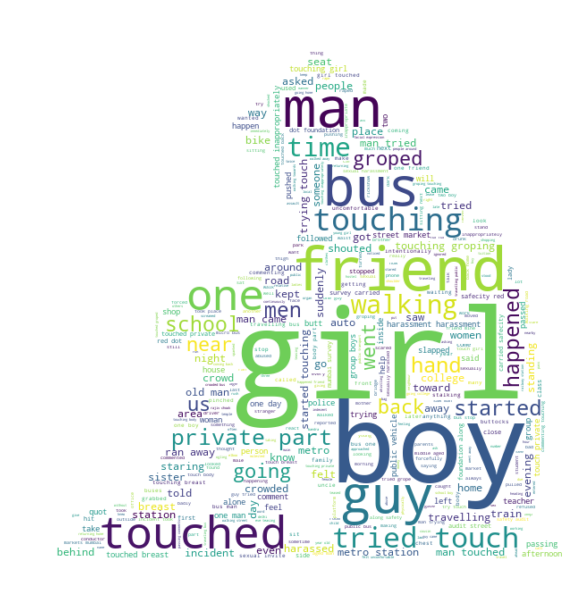

In [132]:
#Without tfidf
WordCloud_gen('TouchingGroping')

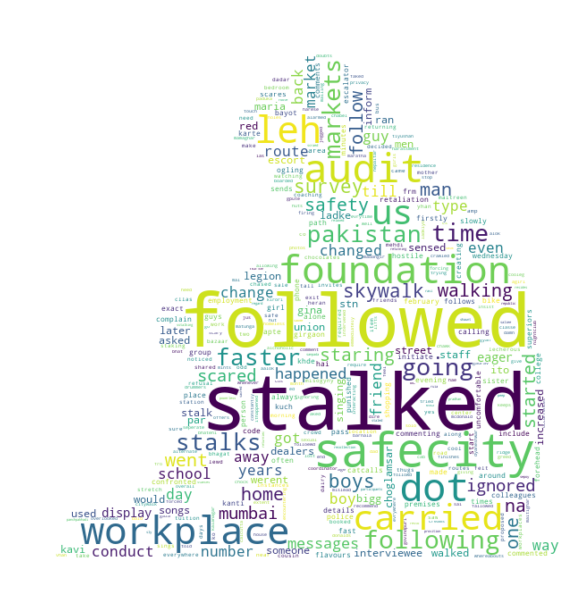

In [145]:
#Third category WITH tfidf, can you guess it?
WordCloud_gen('tfidf', corpus_index=3)

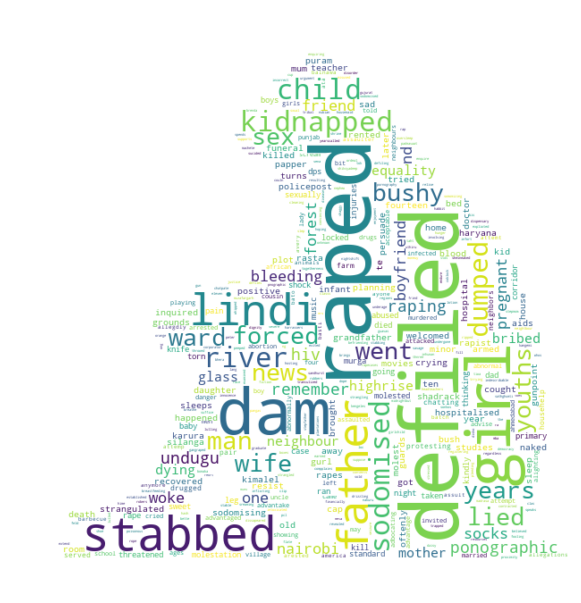

In [148]:
#Can you guess it?
WordCloud_gen('tfidf', corpus_index=6)

### Name Entity Recognition NER

In [0]:
category = open('TouchingGroping.txt', 'r')
content = category.read()

# Tokenize the article into sentences: sentences
sentences = nltk.sent_tokenize(content)

# Tokenize each sentence into words: token_sentences
token_sentences = [word_tokenize(sent) for sent in sentences]

# Tag each tokenized sentence into parts of speech: pos_sentences
pos_sentences = [nltk.pos_tag(sent) for sent in token_sentences] 

# Create the named entity chunks: chunked_sentences
chunked_sentences = nltk.ne_chunk_sents(pos_sentences , binary=False)

# Test for stems of the tree with tags or NE tag
for sent in chunked_sentences:
    for chunk in sent:
        if hasattr(chunk, "label"):# and chunk.label() == "NE":
            print(chunk)

# NNP is proper-noun-singular

(ORGANIZATION Andheri/NNP Station/NNP)
(PERSON Mumbai/NNP)
(ORGANIZATION PEOPLE/NNP)
(PERSON Employee/NNP)
(PERSON Doctor/NNP)
(PERSON James/NNP)
(GPE Benedict/NNP)
(PERSON Faith/NNP)
(PERSON Eucabeth/NNP)
(ORGANIZATION Schillerstraße/NNP)
(GPE Bayerstraße/NNP)
(GPE North/NNP)
(GPE Pettenkoferstraße/NNP)
(GPE Sonnenstraße/NNP)
(PERSON Roshan/NNP Kumar/NNP)
(ORGANIZATION Technical/JJ)
(ORGANIZATION Global/NNP Foundries/NNP)
(GPE Boys/NNP)
(PERSON Isme/NNP)
(PERSON Mahatma/NNP)
(ORGANIZATION IIGJ/NNP)
(GPE Mahabaleshwar/NNP)
(GPE Bhekavali/NNP)
(GPE Bandra/NNP)
(ORGANIZATION SQUEEZE/NNP)
(GPE Was/NNP)
(GPE Number/NNP)
(GPE Bhekavali/NNP)
(GPE Mahabaleshwar/NNP)
(GPE Was/NNP)
(PERSON Experienced/NNP Touching/NNP)
(PERSON Experienced/NNP Beating/NNP)
(ORGANIZATION Incident/NNP)
(ORGANIZATION Incident/NNP)
(GPE Incident/NN)
(ORGANIZATION Incident/NNP)
(ORGANIZATION Incident/NNP)
(ORGANIZATION वकतपर/NNP)
(GPE Lausanne/NNP)
(GPE Geneva/NNP)
(GPE Was/NNP)
(GPE Perfect/JJ)
(ORGANIZATION Ganesh/

['ORGANIZATION', 'PERSON', 'GPE', 'GSP', 'FACILITY', 'LOCATION']


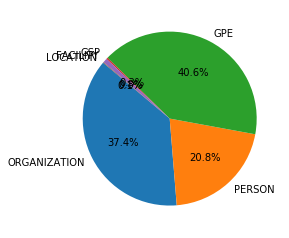

In [0]:
chunked_sentences = nltk.ne_chunk_sents(pos_sentences , binary=False)

# Create the defaultdict: ner_categories
ner_categories = defaultdict(int)

# Create the nested for loop
for sent in chunked_sentences:
    for chunk in sent:
        if hasattr(chunk, 'label'):
            ner_categories[chunk.label()] += 1
            
# Create a list from the dictionary keys for the chart labels: labels
labels = list(ner_categories.keys())
print(labels)
# Create a list of the values: values
values = [ner_categories.get(l) for l in labels]

# Create the pie chart
plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=140)

# Display the chart
plt.show()

In [0]:
category = open('TouchingGroping.txt', 'r')
content = category.read()

# Entities of TouchingGroping DESCRIPTION collection
#Spacy: Different entity types compared to nltk, Informal language corpora, Easily find entities in Tweets and chat messages, Quickly growing!

nlp = spacy.load('en')
nlp.entity
doc = nlp(content)
for ent in doc.ents:
    print(ent.label_, ent.text)

CARDINAL One
CARDINAL one
DATE 19th December 2017
QUANTITY 10.30 am
FAC Andheri Station
GPE Mumbai
TIME a few minutes
TIME a few seconds
CARDINAL 2
ORG Groping
PERSON Employee
TIME evening
PERSON James
DATE three year old
DATE three year old
DATE 15 year old
PRODUCT Benedict
ORG NAME
ORG NAME
ORDINAL first
CARDINAL seven
CARDINAL two hundred
PERSON Faith
TIME night
TIME every evening
TIME around 7:00
DATE the first day
ORDINAL second
ORDINAL third
CARDINAL three
PERSON Eucabeth
CARDINAL two
CARDINAL one
CARDINAL one
PERSON Z
CARDINAL One
TIME One morning
CARDINAL four
DATE four day
CARDINAL one
CARDINAL seven
CARDINAL six
NORP Teachers
ORDINAL first
DATE 2015
CARDINAL 2
DATE 2016
CARDINAL 2
CARDINAL 3
DATE 2017
CARDINAL one
DATE age 19
TIME the evening/night
DATE The quarter
ORG Schillerstraße
TIME about 9 p.m.
GPE Bayerstraße
ORG Paul-Heyse-Straße
GPE Sonnenstraße
CARDINAL one
PERSON Mr Roshan Kumar
ORG Technical Staff
ORG Global Foundries
DATE months
DATE months
CARDINAL Half
CARDINA

### Multilingual NER with polyglot

In [0]:
ptext = Text(content)
#ptext.entities
entities = [(ent.tag, ' '.join(ent)) for ent in ptext.entities]
# Print entities
print(entities)


[('I-LOC', 'Mumbai'), ('I-PER', 'James'), ('I-PER', 'urinated'), ('I-PER', 'Benedict'), ('I-PER', 'Faith'), ('I-PER', 'Eucabeth'), ('I-PER', 'accepted.He'), ('I-ORG', 'groupe'), ('I-LOC', 'Bayerstraße'), ('I-LOC', 'Pettenkoferstraße'), ('I-LOC', 'Paul'), ('I-LOC', 'Sonnenstraße'), ('I-PER', 'Mr Roshan Kumar'), ('I-ORG', 'Staff'), ('I-ORG', 'Global'), ('I-LOC', 'varanasi'), ('I-PER', 'winks'), ('I-LOC', 'pune'), ('I-LOC', 'jaipur'), ('I-PER', 'gandhi'), ('I-LOC', 'sitapura'), ('I-LOC', 'jaipur'), ('I-LOC', 'IIGJ'), ('I-LOC', 'bangalore'), ('I-LOC', '300metre'), ('I-LOC', '300metres'), ('I-LOC', 'Mahabaleshwar'), ('I-LOC', 'Bandra'), ('I-LOC', 'Mahabaleshwar'), ('I-PER', 'groped'), ('I-PER', 'ogling'), ('I-PER', 'indecently'), ('I-PER', 'कॉलेज'), ('I-PER', '। Guy'), ('I-LOC', 'Lausanne'), ('I-LOC', 'Geneva'), ('I-PER', 'kar galt'), ('I-PER', 'karte hani'), ('I-PER', 'Ganesh'), ('I-PER', 'groped'), ('I-PER', 'groped'), ('I-ORG', 'Jai Hind College'), ('I-ORG', 'Government Law College'), ('

### Supervised Text Classification
Using tf-idf feautures (weights) and word count

In [0]:
report_1 = pd.read_csv('Safety_GPS1.csv')
report_1 = report_1[pd.notna(report_1['DESCRIPTION'])]

#Select x and Y (without HumanTrafficking or PettyRobbery is til column 28)
x_report_1 = report_1[report_1.columns[4]]
y_report_1 = report_1[report_1.columns[14:28]]
X_train, X_test, y_train, y_test = train_test_split(x_report_1, y_report_1, test_size=0.2, random_state=17)
categories = y_train.columns

In [153]:
#CountVectorizer
count_vectorizer = CountVectorizer(stop_words='english')
count_train = count_vectorizer.fit_transform(X_train.values)
count_test = count_vectorizer.transform(X_test.values)
print(count_vectorizer.get_feature_names()[:20])
print(count_train.A[:5]) #.A attribute is array

['00', '000', '00am', '00pm', '01', '02', '03', '05', '05th', '06', '07', '08', '0830', '08826862360', '09', '0900', '0930', '0f', '10', '100']
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [154]:
#TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words="english", max_df=0.7)
tfidf_train = tfidf_vectorizer.fit_transform(X_train.values)
tfidf_test = tfidf_vectorizer.transform(X_test.values)
print(tfidf_vectorizer.get_feature_names()[:10])
print(tfidf_train.A[:5])

['00', '000', '00am', '00pm', '01', '02', '03', '05', '05th', '06']
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [156]:
# Check whether the two vectorizers are equal (They shouldn't be)
count_df = pd.DataFrame(count_train.A, columns=count_vectorizer.get_feature_names())
tfidf_df = pd.DataFrame(tfidf_train.A, columns=tfidf_vectorizer.get_feature_names())
difference = set(count_df.columns) - set(tfidf_df.columns)
print('Equality Test output: ', count_df.equals(tfidf_df))

Equality Test output:  False


####Naive Bayes Classifier
Next: SVM or linear models for tf-idf; create a function to iterate over the alphas from 0 to 1 with steps 0.1 with np.arange()

In [157]:
#Initial test for one category, CountVectorizer()
nb_classifier = MultinomialNB()
nb_classifier.fit(count_train, y_train.iloc[:,0])
pred = nb_classifier.predict(count_test)
score = metrics.accuracy_score(y_test.iloc[:,0], pred)
print('Test accuracy is {}'.format(score))
metrics.confusion_matrix(y_test.iloc[:,0], pred)

Test accuracy is 0.8611488014473089


array([[1497,   80],
       [ 227,  407]])

In [158]:
#Initial test for one category, TfidfVectorizer()
nb_classifier = MultinomialNB()
nb_classifier.fit(tfidf_train, y_train.iloc[:,0])
pred = nb_classifier.predict(tfidf_test)
score = metrics.accuracy_score(y_test.iloc[:,0], pred)
print('Test accuracy is {}'.format(score))
metrics.confusion_matrix(y_test.iloc[:,0], pred, labels=[0,1])

Test accuracy is 0.80958842152872


array([[1552,   25],
       [ 396,  238]])

In [163]:
#Inspecting the model

# Get the class labels: class_labels
class_labels = nb_classifier.classes_

# Extract the features: feature_names
feature_names = tfidf_vectorizer.get_feature_names()

# Zip the feature names together with the coefficient array and sort by weights: feat_with_weights
feat_with_weights = sorted(zip(nb_classifier.coef_[0], feature_names))

print(class_labels, feat_with_weights[300:350])

[0 1] [(-9.687577285651056, 'aren'), (-9.687577285651056, 'arena'), (-9.687577285651056, 'ares'), (-9.687577285651056, 'arested'), (-9.687577285651056, 'arguing'), (-9.687577285651056, 'arival'), (-9.687577285651056, 'armbushed'), (-9.687577285651056, 'armed'), (-9.687577285651056, 'army'), (-9.687577285651056, 'arre'), (-9.687577285651056, 'arrest'), (-9.687577285651056, 'arrested'), (-9.687577285651056, 'arrival'), (-9.687577285651056, 'arrives'), (-9.687577285651056, 'arriving'), (-9.687577285651056, 'arterial'), (-9.687577285651056, 'article'), (-9.687577285651056, 'artid'), (-9.687577285651056, 'artificial'), (-9.687577285651056, 'arts'), (-9.687577285651056, 'aruvathimuvar'), (-9.687577285651056, 'asgarali'), (-9.687577285651056, 'ashok'), (-9.687577285651056, 'asians'), (-9.687577285651056, 'aside'), (-9.687577285651056, 'asif'), (-9.687577285651056, 'aso'), (-9.687577285651056, 'aspx'), (-9.687577285651056, 'assassinating'), (-9.687577285651056, 'assaulter'), (-9.68757728565105

In [0]:
#Pipelines
NB_pipeline_CountV = Pipeline([('count', CountVectorizer(stop_words='english')), 
                        ('clf', OneVsRestClassifier(MultinomialNB(fit_prior=True, class_prior=None))),])
NB_pipeline_TfidfV = Pipeline([('tfidf', TfidfVectorizer(stop_words='english')),
                        ('clf', OneVsRestClassifier(MultinomialNB(fit_prior=True, class_prior=None))),])

In [0]:
def execute(pipeline, X_test=X_test):
  
  for category in tqdm(categories):
      print('... Processing {}'.format(category))
      NB_pipeline.fit(X_train, y_train[category])
      prediction = NB_pipeline.predict(X_test)
      if len(X_test) == 1:
        print('Prediction is {}'.format(prediction))
      else:
        print('Test accuracy is {}'.format(metrics.accuracy_score(y_test[category], prediction)))
        print(metrics.confusion_matrix(y_test[category], prediction, labels=[0,1]))

In [180]:
execute(NB_pipeline_CountV)

... Processing Touching /Groping
Test accuracy is 0.8611488014473089
[[1497   80]
 [ 227  407]]
... Processing Catcalls/Whistles
Test accuracy is 0.8132066938037087
[[1559  133]
 [ 280  239]]
... Processing Sexual Invites
Test accuracy is 0.8941655359565808
[[1940   38]
 [ 196   37]]
... Processing Stalking
Test accuracy is 0.9199457259158752
[[2002   27]
 [ 150   32]]
... Processing Others
Test accuracy is 0.8891904115784712
[[1925   26]
 [ 219   41]]
... Processing Commenting
Test accuracy is 0.7815468113975577
[[1166  206]
 [ 277  562]]
... Processing Rape / Sexual Assault
Test accuracy is 0.9493441881501583
[[2067   25]
 [  87   32]]
... Processing North East India Report
Test accuracy is 0.9950248756218906
[[2200    3]
 [   8    0]]
... Processing Indecent Exposure/Masturbation in public
Test accuracy is 0.942107643600181
[[2063    8]
 [ 120   20]]
... Processing Chain Snatching
Test accuracy is 0.9787426503844414
[[2116   11]
 [  36   48]]
... Processing Ogling/Facial Expressions

In [174]:
execute(NB_pipeline_TfidfV)

... Processing Touching /Groping
Test accuracy is 0.8611488014473089
[[1497   80]
 [ 227  407]]
... Processing Catcalls/Whistles
Test accuracy is 0.8132066938037087
[[1559  133]
 [ 280  239]]
... Processing Sexual Invites
Test accuracy is 0.8941655359565808
[[1940   38]
 [ 196   37]]
... Processing Stalking
Test accuracy is 0.9199457259158752
[[2002   27]
 [ 150   32]]
... Processing Others
Test accuracy is 0.8891904115784712
[[1925   26]
 [ 219   41]]
... Processing Commenting
Test accuracy is 0.7815468113975577
[[1166  206]
 [ 277  562]]
... Processing Rape / Sexual Assault
Test accuracy is 0.9493441881501583
[[2067   25]
 [  87   32]]
... Processing North East India Report
Test accuracy is 0.9950248756218906
[[2200    3]
 [   8    0]]
... Processing Indecent Exposure/Masturbation in public
Test accuracy is 0.942107643600181
[[2063    8]
 [ 120   20]]
... Processing Chain Snatching
Test accuracy is 0.9787426503844414
[[2116   11]
 [  36   48]]
... Processing Ogling/Facial Expressions

In [188]:
test_string = [""""He started rubbing my shoulders, telling me I looked stressed. Then he went down in my shirt. 
                  He walked around the living room area and he came back. That is when he touched my breast.
                  Then he grabbed my waist of my pants and also grabbed my hair as I tried to leave. I made it to the door and left.
                  It happened so quickly. I was just trying to get out of the townhouse"""]

execute(NB_pipeline_CountV, test_string)
execute(NB_pipeline_TfidfV, test_string)

... Processing Touching /Groping
Prediction is [1]
... Processing Catcalls/Whistles
Prediction is [0]
... Processing Sexual Invites
Prediction is [0]
... Processing Stalking
Prediction is [0]
... Processing Others
Prediction is [0]
... Processing Commenting
Prediction is [0]
... Processing Rape / Sexual Assault
Prediction is [0]
... Processing North East India Report
Prediction is [0]
... Processing Indecent Exposure/Masturbation in public
Prediction is [0]
... Processing Chain Snatching
Prediction is [0]
... Processing Ogling/Facial Expressions/Staring
Prediction is [0]
... Processing Taking pictures
Prediction is [0]
... Processing Poor / No Street Lighting
Prediction is [0]
... Processing Online Harassment
Prediction is [0]


... Processing Touching /Groping
Prediction is [1]
... Processing Catcalls/Whistles
Prediction is [0]
... Processing Sexual Invites
Prediction is [0]
... Processing Stalking
Prediction is [0]
... Processing Others
Prediction is [0]
... Processing Commenting
Prediction is [0]
... Processing Rape / Sexual Assault
Prediction is [0]
... Processing North East India Report
Prediction is [0]
... Processing Indecent Exposure/Masturbation in public
Prediction is [0]
... Processing Chain Snatching
Prediction is [0]
... Processing Ogling/Facial Expressions/Staring
Prediction is [0]
... Processing Taking pictures
Prediction is [0]
... Processing Poor / No Street Lighting
Prediction is [0]
... Processing Online Harassment
Prediction is [0]


###Los Angeles dataset

In [0]:
report_1 = pd.read_csv('la_crime_2012-2016.csv')
report_1 = report_1[pd.notna(report_1['crime_description'])]
print(report_1.head())
print('shape of the complete dataset: ', report_1.shape)

x_report_1 = report_1[report_1.columns[8]]
##y_report_1 = report_1[report_1.columns[14:30]] #including human_traficking and petty_robbery
#From string comma-separated to boolean
categories=[]
counter = 0

for index, row in tqdm(report_1.iterrows()):
    counter+=1
    cat_group_list = [i for i in row.category.split(',')]
    del(cat_group_list[-1])
    for category in cat_group_list:
      category = [category.lstrip()]
      if category not in categories:
        categories.append(category) #add a new category
      else:
        next
    #replace in the original df with the list. iat[] is to set a single row and 5 is the CATEGORY column index    
    report_1.iat[index, 8] = cat_group_list #CORRECT THIS!!!
    
print("Total number of unique categories : {}\n".format(len(categories)))

#y_report_1 = report_1[report_1.columns[14:28]]
#y_report_1_one = report_1[report_1.columns[14]]
#df_report_1 = pd.concat([x_report_1, y_report_1], axis=1, sort=False)

#X_train, X_test, y_train, y_test = train_test_split(x_report_1, y_report_1, test_size=0.2, random_state=17)
#count_vectorizer = CountVectorizer(stop_words='english') #or TfidfVectorizer(stop_words="english", max_df=0.7)
#count_train = count_vectorizer.fit_transform(X_train.values)
#count_test = count_vectorizer.transform(X_test.values)
#print(count_vectorizer.get_feature_names()[:20])
#print(count_train.A[:5]) #.A attribute is array

           ts  year  month  day  ...       lat      lon  category  crime_description
0  2012010100  2012      1    1  ... -118.2826  33.9310    others  THEFT OF IDENTITY
1  2012010100  2012      1    1  ... -118.3779  34.1922    others  THEFT OF IDENTITY
2  2012010100  2012      1    1  ... -118.2471  34.0151    others  THEFT OF IDENTITY
3  2012010100  2012      1    1  ... -118.2915  33.9850    others  THEFT OF IDENTITY
4  2012010100  2012      1    1  ... -118.2838  33.9747    others  THEFT OF IDENTITY

[5 rows x 9 columns]
shape of the complete dataset:  (1115203, 9)



Total number of unique categories : 0

